In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import roc_auc_score

In [2]:
data = pd.read_csv("dc_weather.csv")
#data.dtypes

In [3]:
#data['is_precip'] = [1 if x>0 else 0 for x in data['precip']]
data['is_precip'] = [1 if x>0 else 0 for x in data['precipcover']]
#[1500 if x == 'Music' else 800 for x in df['Event']]

In [4]:
data['is_precip'].value_counts()

0    1927
1    1392
Name: is_precip, dtype: int64

In [5]:
#data.dtypes

In [6]:
# Import modules
#import matplotlib.pyplot as mp
#import pandas as pd
#import seaborn as sb

#data=data.drop(['precip','precipprob','preciptype'], axis=1)
## Plotting correlation heatmap
#dataplot = sb.heatmap(data.corr())

## Displaying heatmap
#mp.show()

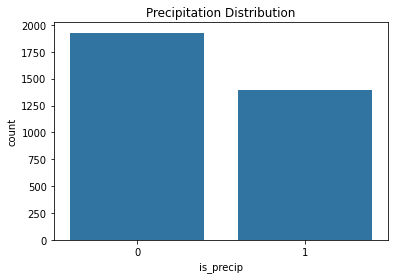

In [7]:
# Visualize the used pin number distribution
sns.countplot(x='is_precip', data=data)
plt.title('Precipitation Distribution')
plt.show()

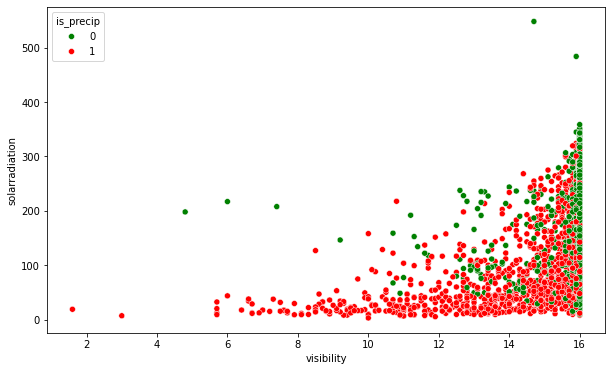

In [26]:
# Create a scatter plot to show the breakdown of fraudulent and non-fraudulent transactions
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=data,
    x='visibility',
    y='solarradiation',
    hue='is_precip',
    palette={0: 'green', 1: 'red'},
)
#plt.title('Fraudulent vs Non-Fraudulent Transactions: Distance from Home vs Ratio to Median Purchase Price')
#plt.xlabel('Distance from Home')
#plt.ylabel('Ratio to Median Purchase Price')
plt.show()

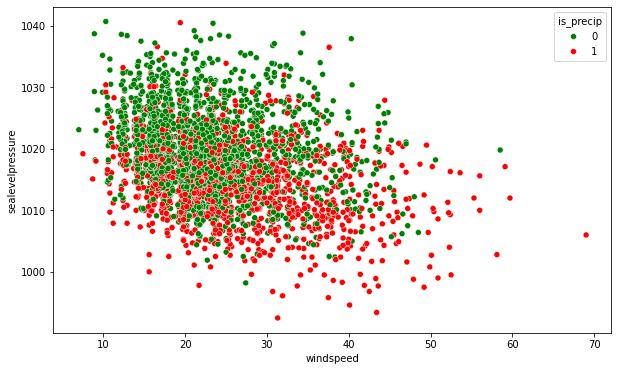

In [45]:
# Create a scatter plot to show the breakdown of fraudulent and non-fraudulent transactions
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=data,
    x='windspeed',
    y='sealevelpressure',
    hue='is_precip',
    palette={0: 'green', 1: 'red'},
)
#plt.title('Fraudulent vs Non-Fraudulent Transactions: Distance from Home vs Ratio to Median Purchase Price')
#plt.xlabel('Distance from Home')
#plt.ylabel('Ratio to Median Purchase Price')
plt.show()

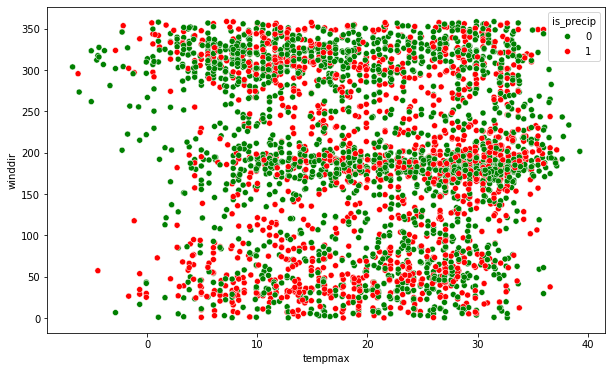

In [47]:
# Create a scatter plot to show the breakdown of fraudulent and non-fraudulent transactions
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=data,
    x='tempmax',
    y='winddir',
    hue='is_precip',
    palette={0: 'green', 1: 'red'},
)
#plt.title('Fraudulent vs Non-Fraudulent Transactions: Distance from Home vs Ratio to Median Purchase Price')
#plt.xlabel('Distance from Home')
#plt.ylabel('Ratio to Median Purchase Price')
plt.show()

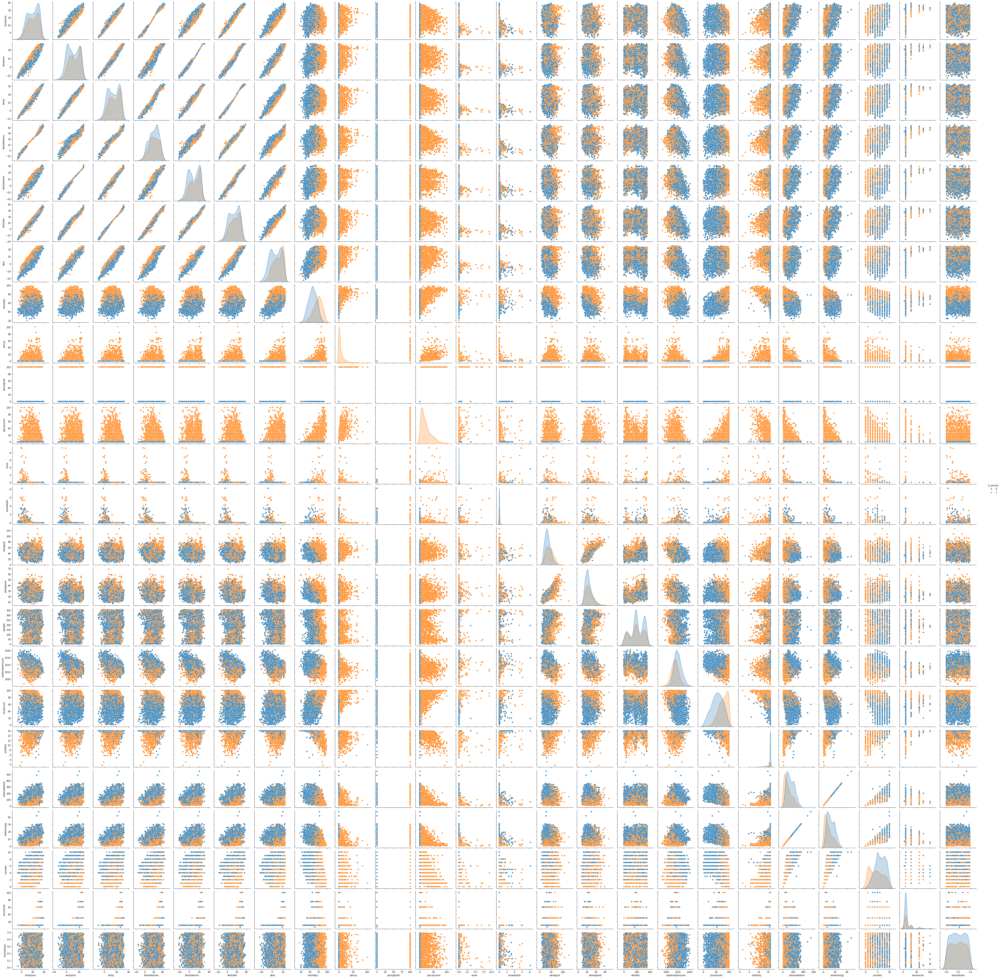

In [46]:
sns.pairplot(data, hue="is_precip")

In [60]:
X = data[['temp', 'dew', 'humidity','windgust']]#,'precipprob']]
#X = data[['visibility', 'solarradiation', 'solarenergy','uvindex']]#,'precipprob']] we tried because of corr matrix but it was worse
y = data['is_precip']

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#X_train, X_val, y_train, y_val = train_test_split(X_test, y_test, test_size=2/3, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=2/3, random_state=42)

In [61]:
print(len(X_train))
print(len(X_val))
print(len(X_test))
print(len(y_train))

2323
664
332
2323


In [62]:
#Knn validation
max_acc=0
neigh=0
max_f1=0
neighhh=0
for i in range(1,51):
    if i ==5:
        continue
    knn_model = KNeighborsClassifier(n_neighbors=i)
    knn_model.fit(X_train,y_train)
    y_pred = knn_model.predict(X_val)
    acc=accuracy_score(y_val,y_pred)
    f1 = f1_score(y_val,y_pred)
    if acc>max_acc:
        max_acc=acc
        neigh=i
    if f1>max_f1:
        max_f1=f1
        neighhh=i
print(max_acc,neigh,max_f1,neighhh)
#0.7650602409638554 7 0.6953125 7
#we pick n_neighbors=7

0.7680722891566265 33 0.7045454545454546 21


In [63]:
#Knn validation
knn_model = KNeighborsClassifier(n_neighbors=3)#21)
knn_model.fit(X_train,y_train)
y_pred_knn = knn_model.predict(X_val)

[[306  69]
 [105 184]]


<AxesSubplot:>

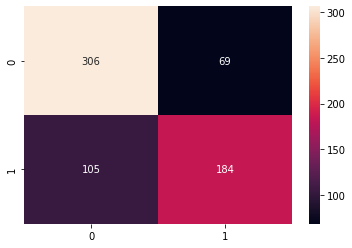

In [64]:
conf = confusion_matrix(y_val,y_pred_knn)
print(conf)
TP=conf[1][1]
TN = conf[0][0]
FN=conf[1][0]
FP=conf[0][1]
sns.heatmap(conf, annot=True, fmt='d', )

In [65]:
accuracy = accuracy_score(y_val,y_pred_knn)
precision = precision_score(y_val,y_pred_knn)
recall = recall_score(y_val,y_pred_knn)
specificity = FP/(TN+FP)
f1 = f1_score(y_val,y_pred_knn)
print(accuracy)
print(precision)
print(recall)
print(specificity)
print(f1)

0.7379518072289156
0.7272727272727273
0.6366782006920415
0.184
0.6789667896678967


[[303  72]
 [ 99 190]]


<AxesSubplot:>

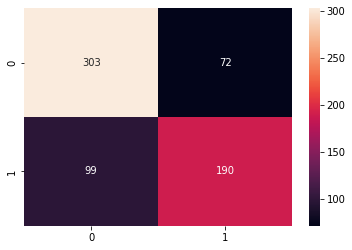

In [66]:
#GaussianNB
knn_model = GaussianNB()
knn_model.fit(X_train,y_train)
y_pred_GNB = knn_model.predict(X_val)

conf = confusion_matrix(y_val,y_pred_GNB)
print(conf)
TP=conf[1][1]
TN = conf[0][0]
FN=conf[1][0]
FP=conf[0][1]
sns.heatmap(conf, annot=True, fmt='d', )

In [67]:
accuracy = accuracy_score(y_val,y_pred_GNB)
precision = precision_score(y_val,y_pred_GNB)
recall = recall_score(y_val,y_pred_GNB)
specificity = FP/(TN+FP)
f1 = f1_score(y_val,y_pred_GNB)
print(accuracy)
print(precision)
print(recall)
print(specificity)
print(f1)

0.7424698795180723
0.7251908396946565
0.657439446366782
0.192
0.6896551724137931


---Training Performance
Train Accuracy: 0.813172621609987
Train f1 Score: 0.7525655644241733
---Testing Performance
Test Accuracy: 0.7484939759036144
Test f1 Score: 0.6731898238747553


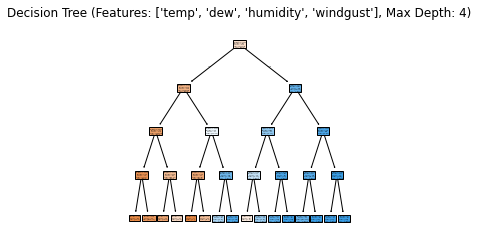

In [68]:
#DecisionTree
features = ['temp', 'dew', 'humidity','windgust']#,'precipprob']
#features = ['visibility', 'solarradiation', 'solarenergy','uvindex']#,'precipprob']] we tried because of corr matrix but it was worse

depth_limit = 4
model = DecisionTreeClassifier(criterion='entropy',max_depth=depth_limit)
model.fit(X_train[features],y_train)
y_pred_train = model.predict(X_train[features])
y_pred_test = model.predict(X_val[features])
train_accuracy = metrics.accuracy_score(y_train,y_pred_train)
train_f1 = metrics.f1_score(y_train,y_pred_train)
test_accuracy = metrics.accuracy_score(y_val,y_pred_test)
test_f1 = metrics.f1_score(y_val,y_pred_test)

print('---Training Performance')
print('Train Accuracy:', train_accuracy)
print('Train f1 Score:',train_f1)
print('---Testing Performance')
print('Test Accuracy:', test_accuracy)
print('Test f1 Score:',test_f1)

plt.figure(figsize=(4,4))
plot_tree(model, feature_names=features,class_names=['precip','no_precip'],filled=True)
plt.title(f"Decision Tree (Features: {features}, Max Depth: {depth_limit})")
plt.show()

[[325  50]
 [117 172]]


<AxesSubplot:>

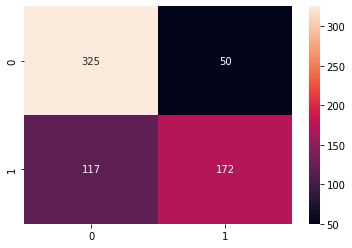

In [69]:
conf = confusion_matrix(y_val,y_pred_test)
print(conf)
TP=conf[1][1]
TN = conf[0][0]
FN=conf[1][0]
FP=conf[0][1]
sns.heatmap(conf, annot=True, fmt='d', )

In [70]:
accuracy = accuracy_score(y_val,y_pred_test)
precision = precision_score(y_val,y_pred_test)
recall = recall_score(y_val,y_pred_test)
specificity = FP/(TN+FP)
f1 = f1_score(y_val,y_pred_test)
print(accuracy)
print(precision)
print(recall)
print(specificity)
print(f1)

0.7484939759036144
0.7747747747747747
0.5951557093425606
0.13333333333333333
0.6731898238747553


In [71]:
knn_model = KNeighborsClassifier(n_neighbors=21)
knn_model.fit(X_train,y_train)
y_pred_knn = knn_model.predict_proba(X_val)[:, 1]
print(roc_auc_score(y_val, y_pred_knn))

#GaussianNB
knn_model = GaussianNB()
knn_model.fit(X_train,y_train)
y_pred_GNB = knn_model.predict_proba(X_val)[:, 1]
print(roc_auc_score(y_val, y_pred_GNB))

#DecisionTree
features = ['temp', 'dew', 'humidity','windgust']#,'precipprob']
depth_limit = 4
model = DecisionTreeClassifier(criterion='entropy',max_depth=depth_limit)
model.fit(X_train[features],y_train)
y_pred_test = model.predict_proba(X_val[features])[:, 1]
print(roc_auc_score(y_val, y_pred_test))


0.8398477508650519
0.8071510957324106
0.8251718569780854


In [72]:
len(y_pred_knn)

664

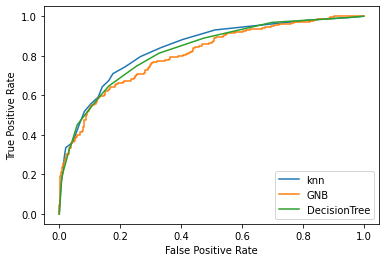

In [73]:
fpr, tpr, thresholds = roc_curve(y_val,np.ravel(y_pred_knn))
plt.plot(fpr, tpr, label='knn')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

fpr, tpr, thresholds = roc_curve(y_val, y_pred_GNB)
plt.plot(fpr, tpr,label='GNB')

fpr, tpr, thresholds = roc_curve(y_val, y_pred_test)
plt.plot(fpr, tpr,label='DecisionTree')

plt.legend()

0.8012048192771084
0.7457627118644068
0.7096774193548387
0.13333333333333333
0.7272727272727273


<AxesSubplot:>

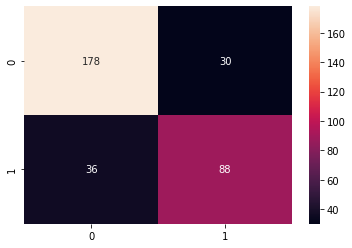

In [74]:
#GaussianNB Test
knn_model = KNeighborsClassifier(n_neighbors=21)
knn_model.fit(X_train,y_train)
y_pred_GNB = knn_model.predict(X_test)

accuracy = accuracy_score(y_test,y_pred_GNB)
precision = precision_score(y_test,y_pred_GNB)
recall = recall_score(y_test,y_pred_GNB)
specificity = FP/(TN+FP)
f1 = f1_score(y_test,y_pred_GNB)
print(accuracy)
print(precision)
print(recall)
print(specificity)
print(f1)
conf = confusion_matrix(y_test,y_pred_GNB)
sns.heatmap(conf, annot=True, fmt='d', )